## Imports

In [15]:
%load_ext autoreload
%autoreload 2

# Standard imports
import glob

# 3rd party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np 
from pprint import pprint
import SimpleITK as sitk

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Functions

In [16]:
def read_tif(filepath):
    """
    Read tiff files using SimpleITK
    
    Args:
        filepath: str, path to tiff file
        
    Returns:
        image: np.ndarray, tiff image
    """
    image = sitk.ReadImage(filepath)
    image = sitk.GetArrayFromImage(image)
    return image


def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img


def gamma_correction(image: np.ndarray, gamma: float=2.0) -> np.ndarray:
    """
    Apply gamma correction to the image.
    
    Args:
        image: np.ndarray, input image
        gamma: float, gamma value
        
    Returns:
        image_enhanced: np.ndarray, gamma corrected image
    """
    # Normalize the image to the range [0, 1]
    image_normalized = image / image.max()
    # Apply the exponential transformation
    image_enhanced = np.power(image_normalized, gamma)
    # Rescale the image back to the original intensity range
    image_enhanced = image_enhanced * image.max()
    return image_enhanced


def compute_average_image(images):
    """
    Compute the average image from a list of images.
    
    Args:
        images: list, list of images
        
    Returns:
        average_image: np.ndarray, average image
    """
    average_image = np.mean(images, axis=0)
    return average_image


def show_4(original_image, contrast_enhanced, thresholded, xlim=None, ylim=None):
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original zoomed")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 2)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.title("Contrast enhanced")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 3)
    plt.imshow(thresholded, cmap='gray')
    plt.title("Thresholded")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 4)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.contour(thresholded, colors='red', linewidths=0.5, alpha=0.35)
    plt.title("Contrast enhanced + contour")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])
    plt.show()
    
    
def save_figure(image, filename, contours=None):
    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap='gray')
    if contours is not None:
        plt.contour(contours, colors='red', linewidths=0.15, alpha=0.35)
    plt.axis('off')
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    print(f"Saved figure to {filename}")

In [17]:
import itk
import numpy as np
from skimage.morphology import remove_small_objects, binary_closing, disk, remove_small_holes


def detect_vessels(input_image: np.ndarray, min_sigma: float=1.0, max_sigma: float=10.0, num_steps: int=10):
    # Run ITK
    input_image = itk.image_from_array(input_image)
    #input_image = itk.imread(input_image, itk.F)

    ImageType = type(input_image)
    Dimension = input_image.GetImageDimension()
    HessianPixelType = itk.SymmetricSecondRankTensor[itk.D, Dimension]
    HessianImageType = itk.Image[HessianPixelType, Dimension]

    objectness_filter = itk.HessianToObjectnessMeasureImageFilter[
        HessianImageType, ImageType
    ].New()
    objectness_filter.SetBrightObject(False)  # Set to True if the structures are bright on a dark background
    objectness_filter.SetScaleObjectnessMeasure(False)  # Set to True to scale the objectness measure by the scale
    objectness_filter.SetAlpha(0.5)  # Sensitivity to blob-like structures
                                     # Set/Get Alpha, the weight corresponding to R_A 
                                     # (the ratio of the smallest eigenvalue that has to be large to the larger ones). 
                                     # Smaller values lead to increased sensitivity to the object dimensionality.
    objectness_filter.SetBeta(1)   # Sensitivity to plate-like structures - 1.0 default
                                     # Set/Get Beta, the weight corresponding to R_B 
                                     # (the ratio of the largest eigenvalue that has to be small to the larger ones). 
                                     # Smaller values lead to increased sensitivity to the object dimensionality.
    objectness_filter.SetGamma(5.0)  # Sensitivity to noise - 5.0 default
                                     # Set/Get Gamma, the weight corresponding to S 
                                     # (the Frobenius norm of the Hessian matrix, or second-order structureness)

    multi_scale_filter = itk.MultiScaleHessianBasedMeasureImageFilter[
        ImageType, HessianImageType, ImageType
    ].New()
    multi_scale_filter.SetInput(input_image)
    multi_scale_filter.SetHessianToMeasureFilter(objectness_filter)
    multi_scale_filter.SetSigmaStepMethodToLogarithmic()
    multi_scale_filter.SetSigmaMinimum(min_sigma)
    multi_scale_filter.SetSigmaMaximum(max_sigma)
    multi_scale_filter.SetNumberOfSigmaSteps(num_steps)

    OutputPixelType = itk.UC
    OutputImageType = itk.Image[OutputPixelType, Dimension]

    rescale_filter = itk.RescaleIntensityImageFilter[ImageType, OutputImageType].New()
    rescale_filter.SetInput(multi_scale_filter)
    rescale_filter.Update()

    # Get numpy array
    segmented_vessels = rescale_filter.GetOutput()
    segmented_vessels_array = itk.array_view_from_image(segmented_vessels)
    segmented_vessels_array = np.asarray(segmented_vessels_array, dtype=np.float32)
    return segmented_vessels_array


def process_vessels(vessel_image: np.ndarray, thresh: int, min_size: int=10, area_threshold: float=2000, smoothing: int=3):
    # Process the thresholded vessels
    thresholded_vessels = vessel_image > thresh
    thresholded_vessels = np.invert(thresholded_vessels)

    # Get rid of small objects
    thresholded_vessels = remove_small_objects(thresholded_vessels, min_size=min_size)
    thresholded_vessels = remove_small_holes(thresholded_vessels, area_threshold=area_threshold)

    # Smoothen edges
    thresholded_vessels = binary_closing(thresholded_vessels, footprint=disk(smoothing))
    
    return thresholded_vessels


def get_brain_mask(brain_image, area_threshold=300000, min_size=10000):
    """
    Get the mask of the brain from the image (run before contrast enhancement).
    
    Args:
        brain_image: np.ndarray, input image
        thresh: int, threshold value
        area_threshold: int, area threshold
        
    Returns:
        mask: np.ndarray, mask of the brain
    """
    _, mask = cv2.threshold(brain_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)
    mask = remove_small_holes(mask.astype(bool), area_threshold=area_threshold)
    mask = remove_small_objects(mask, min_size=min_size)
    #assert( labels.max() != 0 ) # assume at least 1 CC
    #largestCC = labels == np.argmax(np.bincount(labels.flat)[1:])+1
    return mask


## Load data

In [18]:
m1_path = "/media/data/u01/Fig7/7a/M63/*/*.tif"
m1_data = sorted(glob.glob(m1_path))
print(f"Found {int(len(m1_data)/2)} slices")
m1_data

Found 4 slices


['/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 2/CH1.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 2/CH2.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 3/CH1.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 3/CH2.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 4/CH1.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 4/CH2.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 5/CH1.tif',
 '/media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 5/CH2.tif']

Apply exponential scaling on the image

TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFImageIO (0x1093bb60): EXIFIFDOffset has unsupported data type (18) for meta-data dictionary.

TIFFImageIO (0x1093bb60): EXIFIFDOffset has unsupported data type (18) for meta-data dictionary.

TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFImageIO (0x1093bb60): EXIFIFDOffset has unsupported data type (18) for meta-data dictionary.

TIFFImageIO (0x1093bb60): EXIFIFDOffset has unsupported data type (18) for meta-data dictionary.



Ch1: /media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 4/CH1.tif
Ch2: /media/data/u01/Fig7/7a/M63/Fig7a_M63_slice 4/CH2.tif
Image shape: (9028, 14005)
Channel shape: (9028, 14005)
Channel dtype: uint16
Channel min: 0
Channel max: 14413
Channel mean: 110.04406267810234


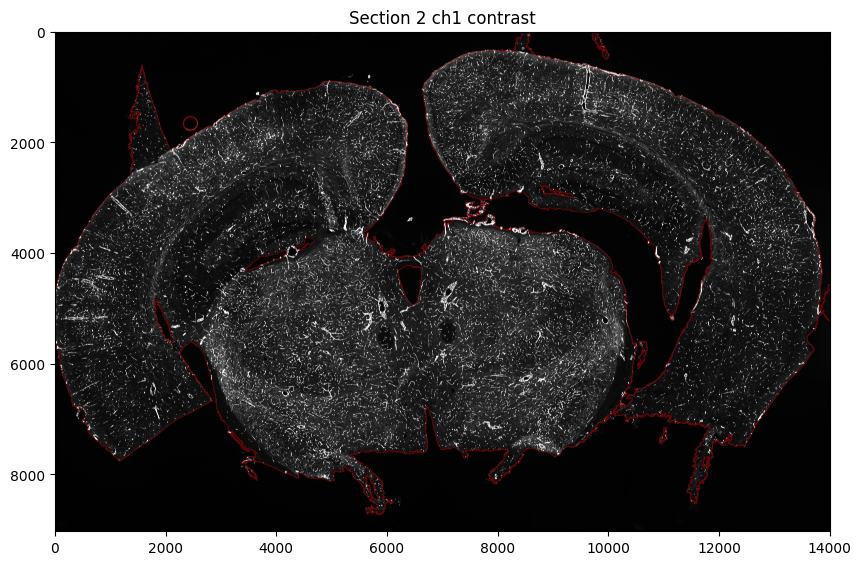

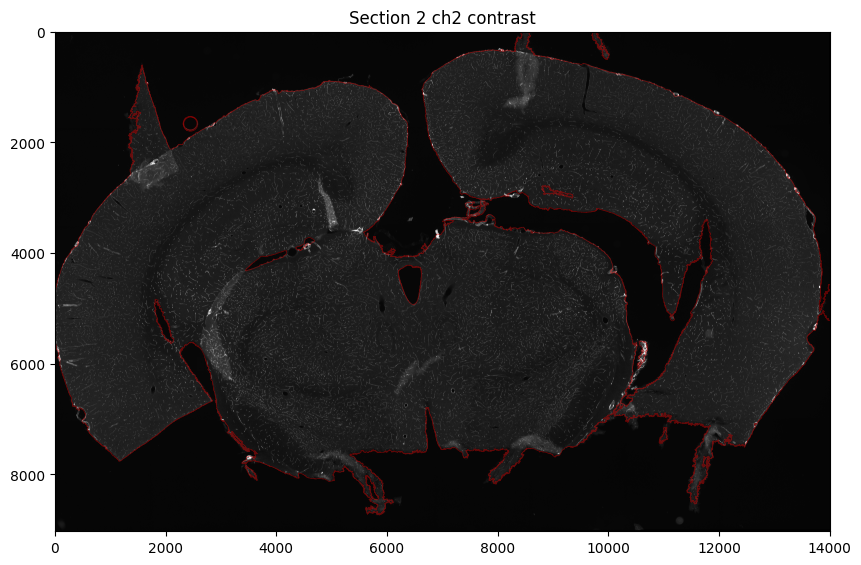

In [19]:
IDX = 2

# Load the image
IDX *= 2
curr_img = (read_tif(m1_data[IDX]), read_tif(m1_data[IDX + 1]))
print("Ch1:", m1_data[IDX])
print("Ch2:", m1_data[IDX + 1])
print("Image shape:", curr_img[0].shape)
curr_ch1 = curr_img[0]
curr_ch2 = curr_img[1]

# Check image stats
print(f"Channel shape: {curr_ch1.shape}")
print(f"Channel dtype: {curr_ch1.dtype}")
print(f"Channel min: {curr_ch1.min()}")
print(f"Channel max: {curr_ch1.max()}")
print(f"Channel mean: {curr_ch1.mean()}")


# Ch1 settings
gamma_ch1 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch1 = 0.25  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default

# Ch1 settings
gamma_ch2 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch2 = 0.125  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default


# No change
contrast_ch1 = curr_ch1
contrast_ch2 = curr_ch2

cc_ch1 = auto_contrast(contrast_ch1, alpha=contrast_alpha_ch1)
cc_ch2 = auto_contrast(contrast_ch2, alpha=contrast_alpha_ch2)

# Compute the original image contrast
#contrast_ch0 = gamma_correction(curr_ch0, gamma=gamma_ch0)
#contrast_ch0 = auto_contrast(contrast_ch0, alpha=contrast_alpha_ch0)
#contrast_ch1 = gamma_correction(curr_ch1, gamma=gamma_ch1)
#contrast_ch1 = auto_contrast(contrast_ch1, alpha=contrast_alpha_ch1)
#contrast_ch2 = gamma_correction(curr_ch2, gamma=gamma_ch2)
#contrast_ch2 = auto_contrast(contrast_ch2, alpha=contrast_alpha_ch2)

#bg_mask = gamma_correction(curr_ch0, gamma=gamma_ch0)
if IDX == 99999: 
    bg_alpha = 0.25
else:
    bg_alpha = 7  # 
bg_mask = auto_contrast(curr_ch1, alpha=bg_alpha)  # 7


bg_mask = get_brain_mask(bg_mask, area_threshold=25000)  # 255 default ch0, 150 for ch1


f = plt.figure(figsize=(10, 10))
plt.imshow(cc_ch1, cmap='gray')
plt.contour(bg_mask, colors='red', linewidths=0.5, alpha=0.35)
plt.title(f"Section {IDX//2} ch1 contrast")
#plt.axis('off')
plt.show()
f.clear()
plt.close(f)
f = plt.figure(figsize=(10, 10))
plt.imshow(cc_ch2, cmap='gray')
plt.contour(bg_mask, colors='red', linewidths=0.5, alpha=0.35)
plt.title(f"Section {IDX//2} ch2 contrast")
#plt.axis('off')
plt.show()
f.clear()
plt.close(f)


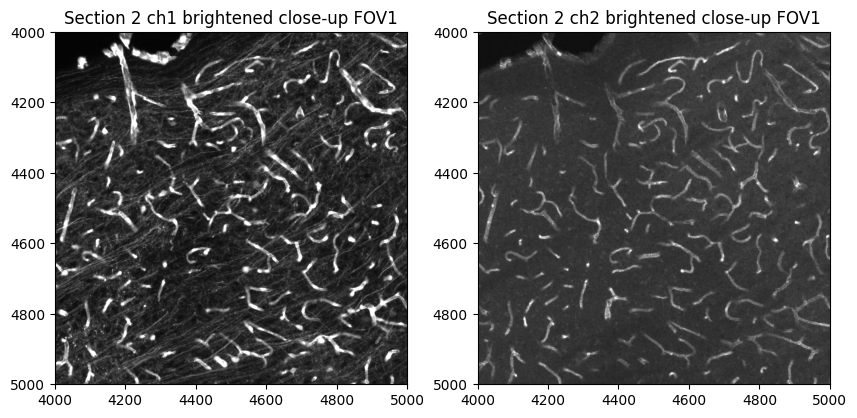

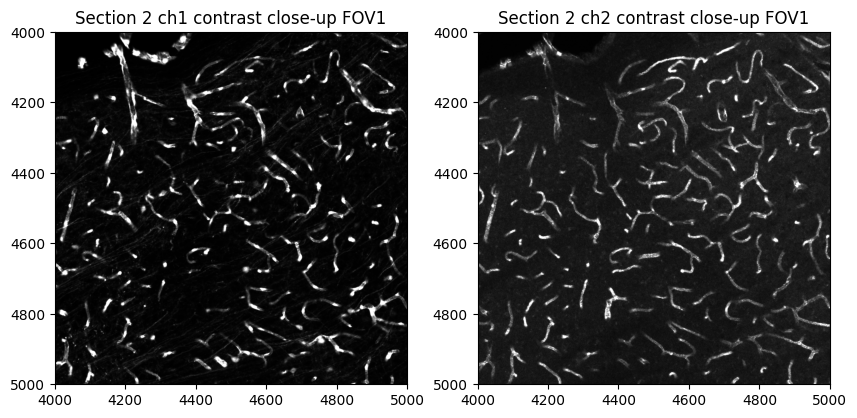

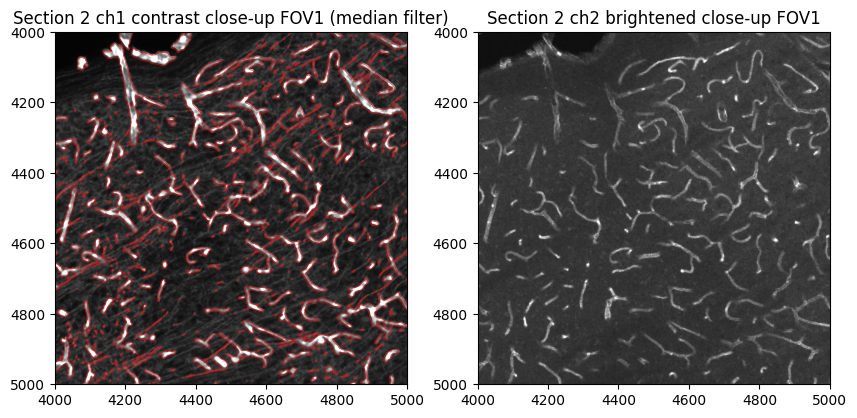

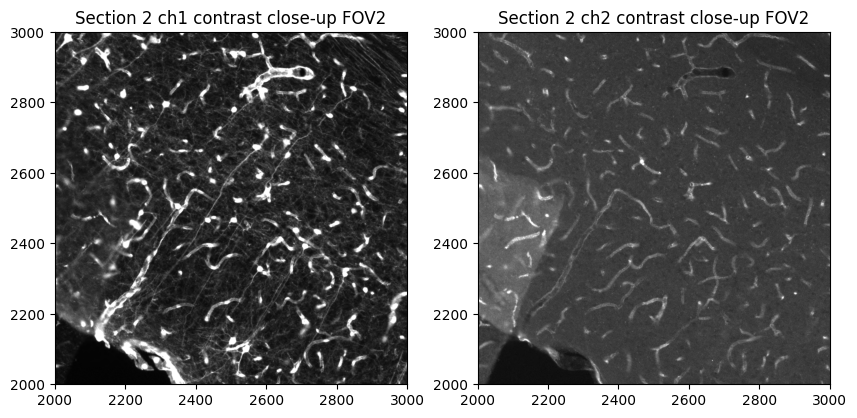

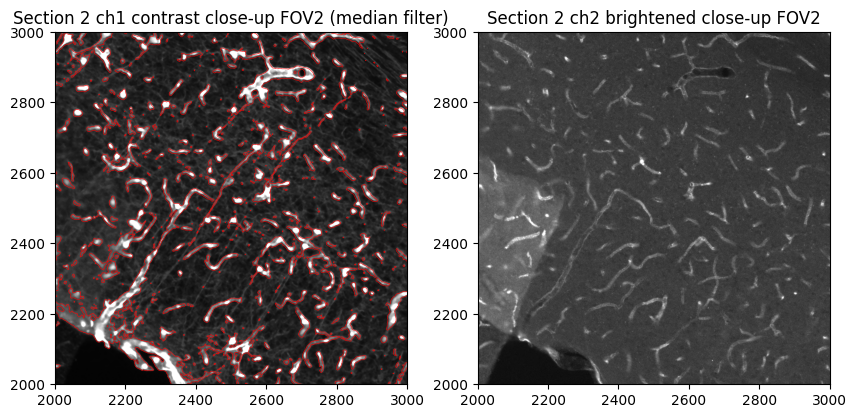

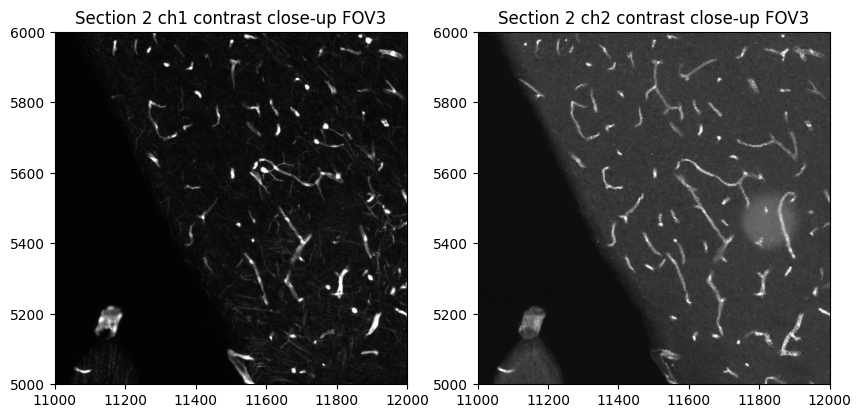

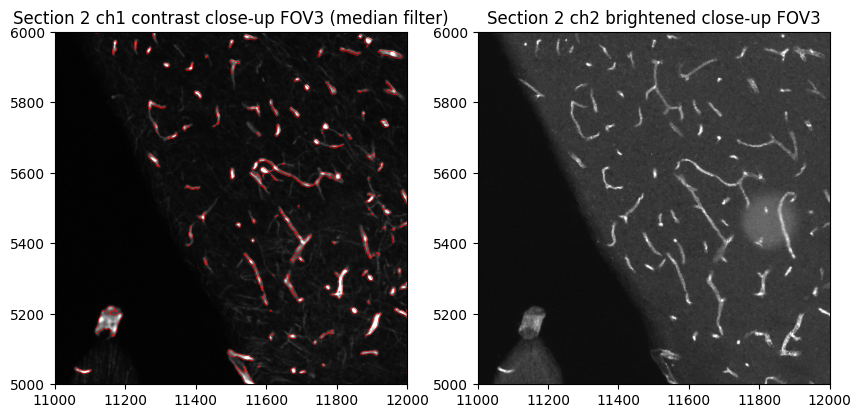

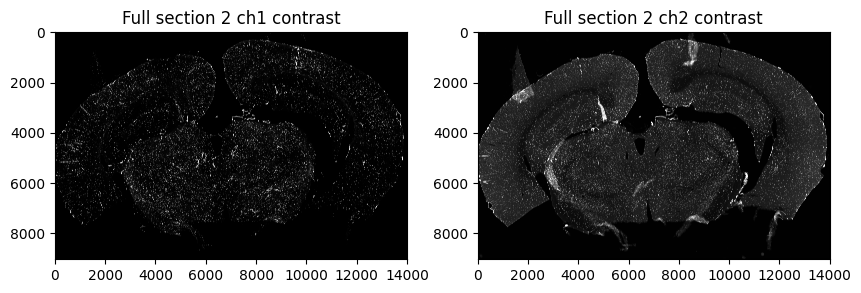

In [20]:
from scipy import ndimage

# Ch1 settings
gamma_ch1 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch1 = 3  # 2

# Ch2 settings
gamma_ch2 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch2 = 5.325  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default

THRESH = 300 # 200

xlim = [4000, 5000]
ylim = [4000, 5000] 

curr_ch1_process = ndimage.median_filter(curr_ch1.copy(), size=5)
curr_ch1_process_thresh = curr_ch1_process.copy() > THRESH

cc_ch1 = gamma_correction(curr_ch1, gamma=gamma_ch1)
cc_ch1 = auto_contrast(cc_ch1, alpha=contrast_alpha_ch1)

cc_ch2 = gamma_correction(curr_ch2, gamma=gamma_ch2)
cc_ch2 = auto_contrast(cc_ch2, alpha=contrast_alpha_ch2)


auto_ch1 = auto_contrast(curr_ch1, alpha=0.25)
auto_ch1_median = auto_contrast(curr_ch1_process, alpha=0.25)
auto_ch2 = auto_contrast(curr_ch2, alpha=0.25)


# Show close up
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1, cmap='gray')
plt.title(f"Section {IDX//2} ch1 brightened close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 brightened close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.show()
f.clear()
plt.close(f)

# Show close up
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cc_ch1, cmap='gray')
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.subplot(1, 2, 2)
plt.imshow(cc_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 contrast close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.show()
f.clear()
plt.close(f)


f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1_median, cmap='gray')
plt.contour(curr_ch1_process_thresh, colors='red', linewidths=0.5, alpha=0.75)
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV1 (median filter)")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 brightened close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.show()
f.clear()
plt.close(f)




# Show close up
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1, cmap='gray')
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV2")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 contrast close-up FOV2")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.show()
f.clear()
plt.close(f)


f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1_median, cmap='gray')
plt.contour(curr_ch1_process_thresh, colors='red', linewidths=0.5, alpha=0.75)
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV2 (median filter)")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 brightened close-up FOV2")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.show()
f.clear()
plt.close(f)

# Show close up
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1, cmap='gray')
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV3")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 contrast close-up FOV3")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.show()
f.clear()
plt.close(f)


f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1_median, cmap='gray')
plt.contour(curr_ch1_process_thresh, colors='red', linewidths=0.5, alpha=0.75)
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV3 (median filter)")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch2, cmap='gray')
plt.title(f"Section {IDX//2} ch2 brightened close-up FOV3")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.show()
f.clear()
plt.close(f)

##########################################################

# Show full slice
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cc_ch1, cmap='gray')
plt.title(f"Full section {IDX//2} ch1 contrast")
plt.subplot(1, 2, 2)
plt.imshow(cc_ch2, cmap='gray')
plt.title(f"Full section {IDX//2} ch2 contrast")
plt.show()
f.clear()
plt.close(f)

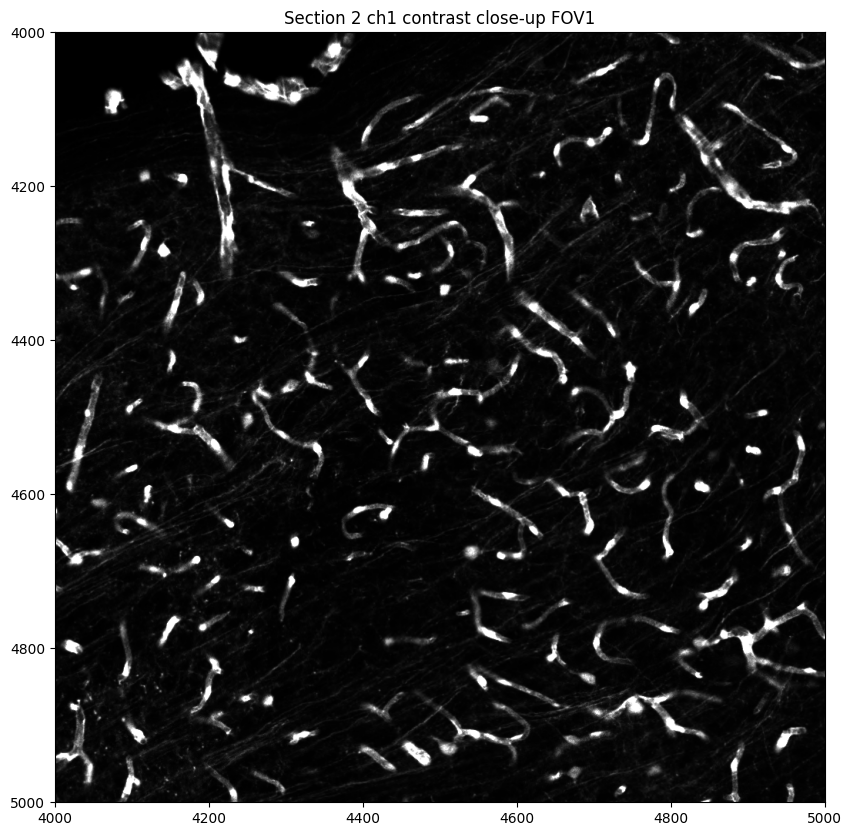

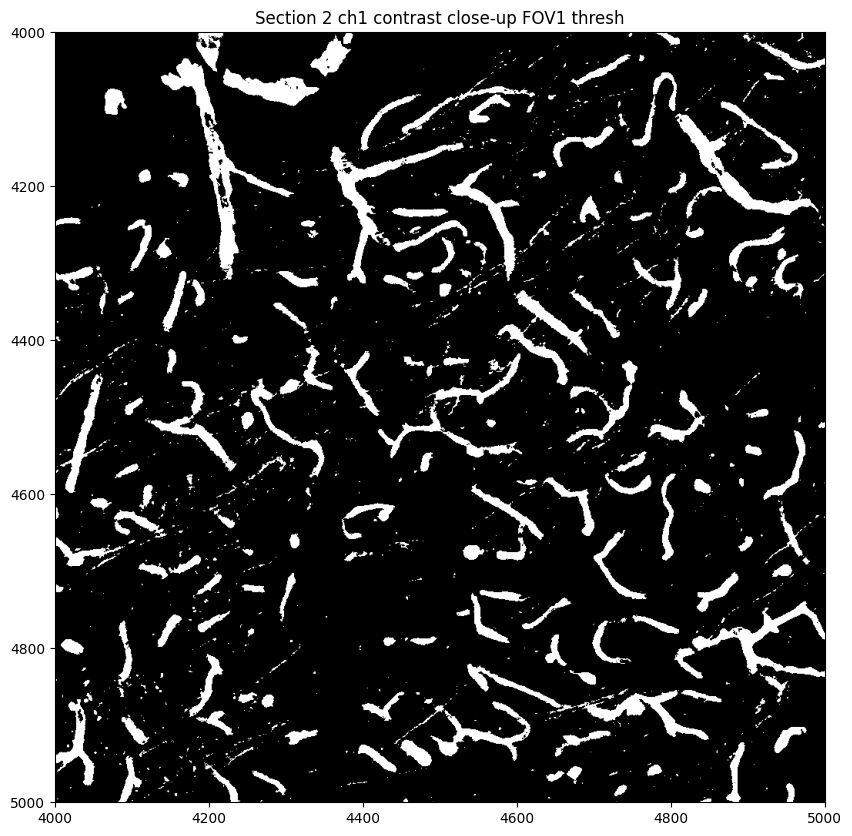

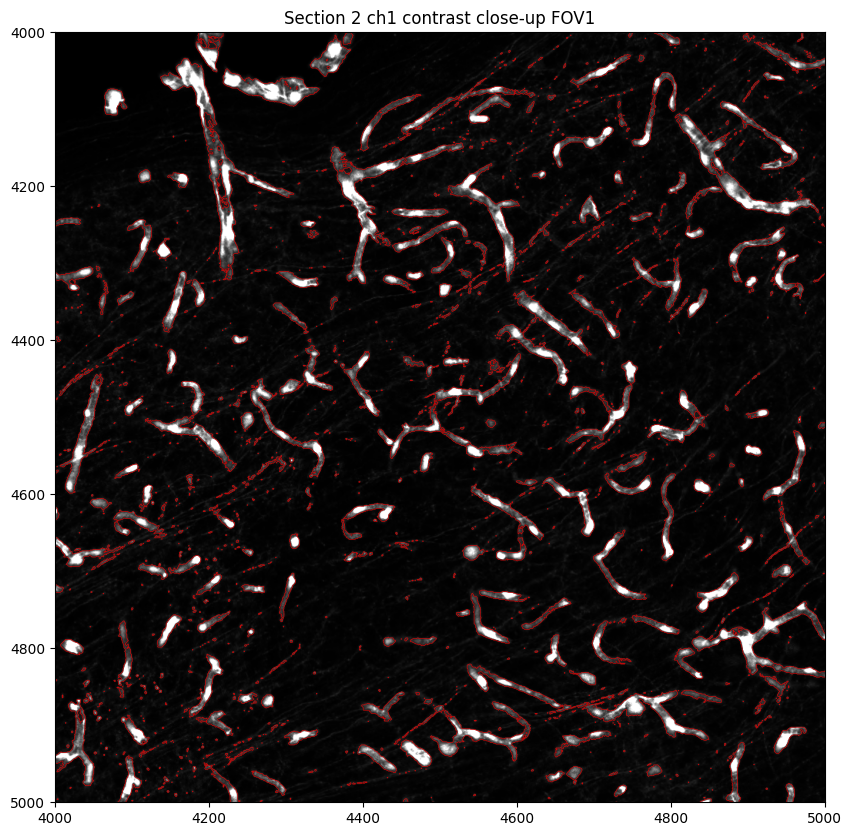

In [21]:
THRESH2 = 35
thresholded_contrast = cc_ch1.copy() > THRESH2
thresholded_contrast[thresholded_contrast != 0] = 1
thresholded_contrast = thresholded_contrast.astype(bool)
#thresholded_contrast = remove_small_objects(thresholded_contrast, min_size=100)
#_, thresholded_contrast = cv2.threshold(cc_ch1.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)
#thresholded_contrast = cv2.adaptiveThreshold(cc_ch1.copy(), 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 211, 2)

f = plt.figure(figsize=(10, 10))
plt.imshow(cc_ch1, cmap='gray')
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.show()
f.clear()
plt.close(f)

f = plt.figure(figsize=(10, 10))
plt.imshow(thresholded_contrast, cmap='gray')
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV1 thresh")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.show()
f.clear()
plt.close(f)


f = plt.figure(figsize=(10, 10))
plt.imshow(cc_ch1, cmap='gray')
plt.contour(thresholded_contrast, colors='red', linewidths=0.5, alpha=0.75)
plt.title(f"Section {IDX//2} ch1 contrast close-up FOV1")
plt.xlim(xlim)
plt.ylim(ylim[::-1])
plt.show()
f.clear()
plt.close(f)

## Hessian Filter
https://examples.itk.org/src/nonunit/review/segmentbloodvesselswithmultiscalehessianbasedmeasure/documentation

# CHANNEL 1

Input image type: float32
Input image min: 0.0
Input image max: 65025.0
Vesselness image statistics:
Shape: (9028, 14005)
Min: 0.0
Max: 255.0
Mean: 144.2167
Median: 247.0
CHANNEL 1


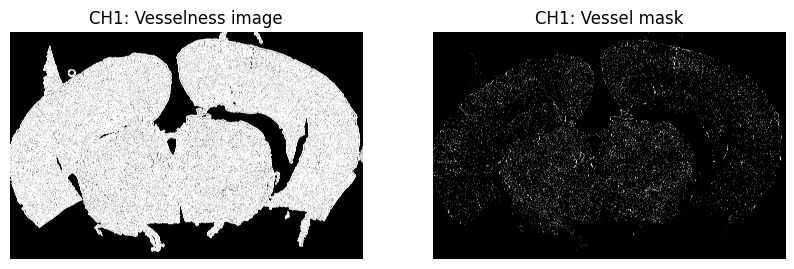

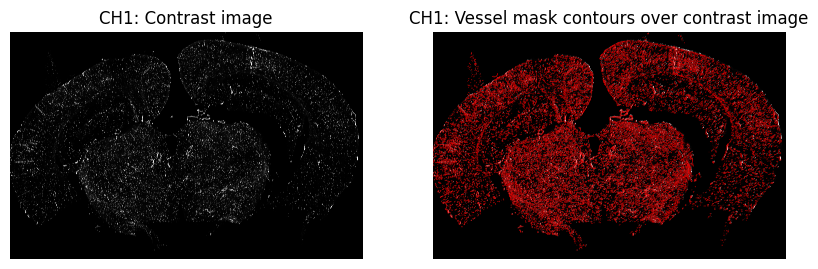

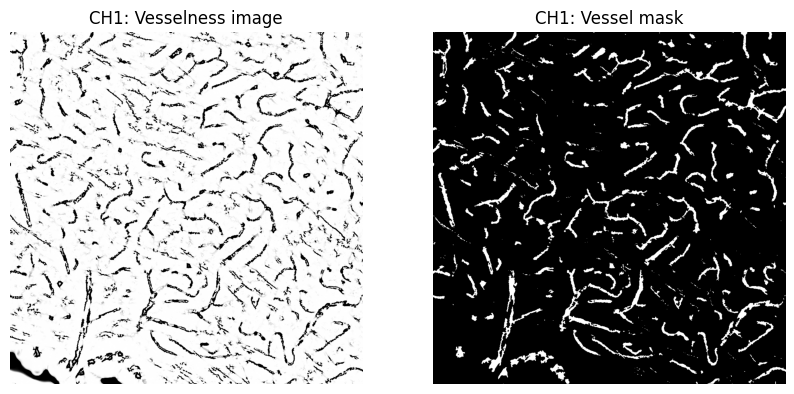

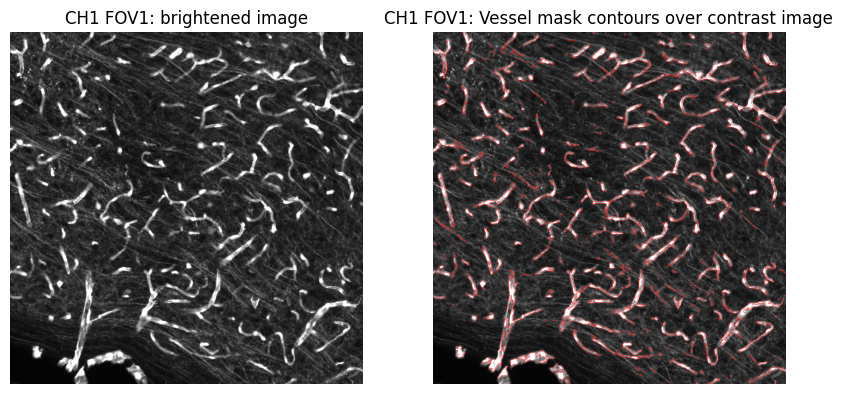

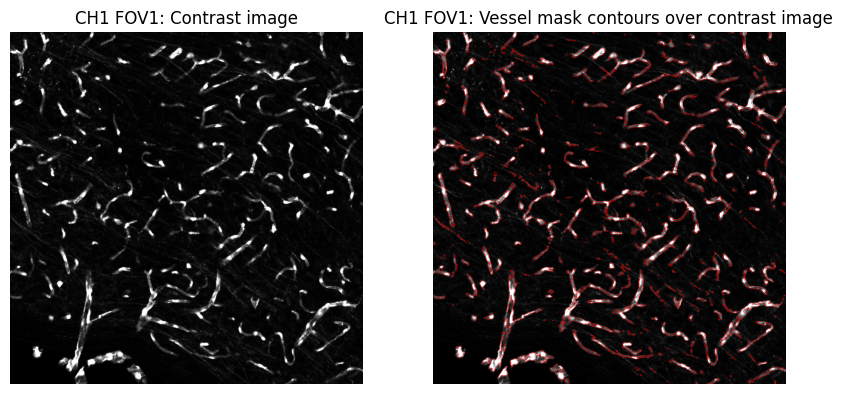

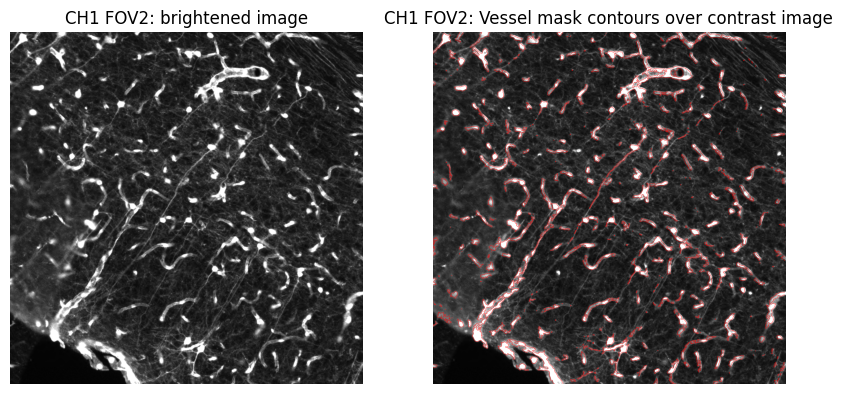

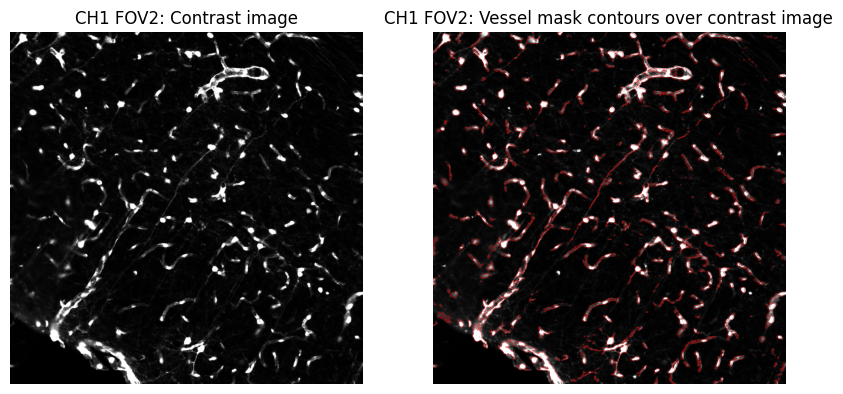

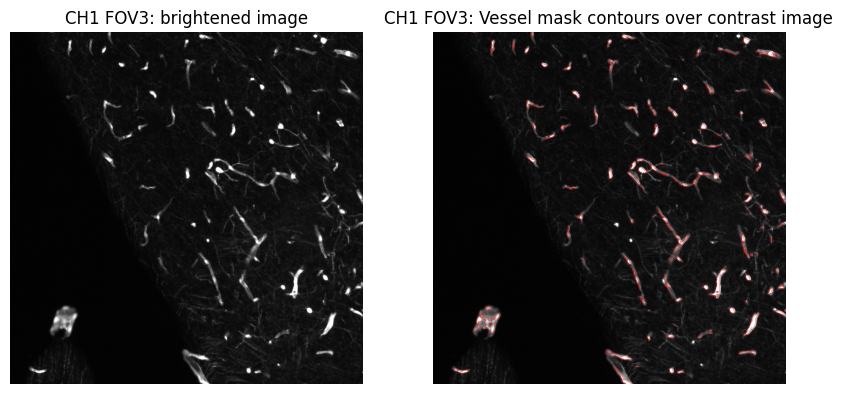

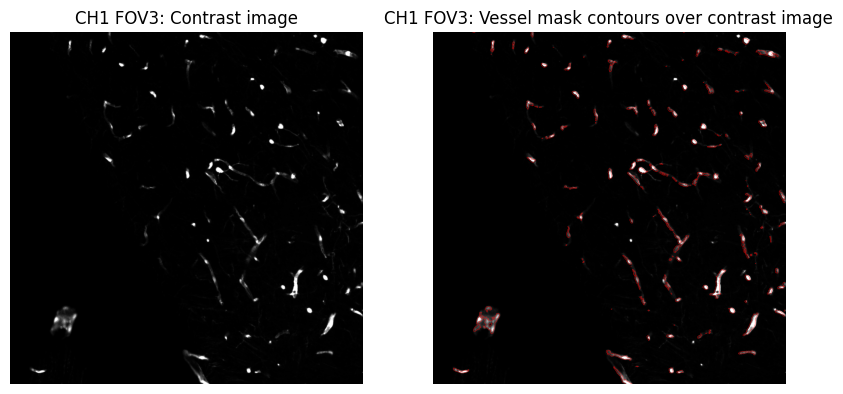

In [22]:
# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0  # 10
number_of_sigma_steps = 10  # 10 Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 100  # Minimum size of objects to keep
area_threshold = 2000 # Minimum area of holes to keep
smoothing = 1  # Smoothing factor for closing, 3


xlim = [4000, 5000]  # 8000, 9000 or 9000, 10000
ylim = [4000, 5000]  # 8000, 9000

THRESH2 = 35
thresholded_contrast = cc_ch1.copy() > THRESH2
thresholded_contrast[thresholded_contrast != 0] = 1
thresholded_contrast = thresholded_contrast.astype(bool)

#THRESH = 200  # 200
#ch1_postprocess_mask = ndimage.median_filter(curr_ch1.copy(), size=5)
#ch1_postprocess_mask = ch1_postprocess_mask > THRESH
#ch1_postprocess_mask[ch1_postprocess_mask != 0] = 1
#ch1_postprocess_mask = ch1_postprocess_mask.astype(bool)


#############################################################

# Alternative: load image in memory
#input_image = contrast_ch1 * bg_mask
input_image = cc_ch1 * bg_mask
input_image = input_image.astype(np.float32)
input_image *= 255.0

# Print statistics
print("Input image type:", input_image.dtype)
print("Input image min:", input_image.min())
print("Input image max:", input_image.max())

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Process the thresholded vessels
thresholded_vessels_ch1 = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
thresholded_vessels_ch1 = thresholded_vessels_ch1 * bg_mask

# NEW: Get only the postprocessed regions
thresholded_vessels_ch1 = thresholded_vessels_ch1 * thresholded_contrast

# Print statistics
print("Vesselness image statistics:")
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:", np.median(segmented_vessels_array))
#print("Std:", segmented_vessels_array.std())

print("CHANNEL 1")

# Plot the raw vesselness image
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("CH1: Vesselness image")
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1: Vessel mask")
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cc_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1: Contrast image")
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1: Vessel mask contours over contrast image")
plt.show()
f.clear()
plt.close(f)

# Plot the raw vesselness image
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("CH1: Vesselness image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1: Vessel mask")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()
f.clear()
plt.close(f)


# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1 FOV1: brightened image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(auto_ch1, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1 FOV1: Vessel mask contours over contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cc_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1 FOV1: Contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(cc_ch1, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1 FOV1: Vessel mask contours over contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()
f.clear()
plt.close(f)


# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1 FOV2: brightened image")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch1, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1 FOV2: Vessel mask contours over contrast image")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cc_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1 FOV2: Contrast image")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.subplot(1, 2, 2)
plt.imshow(cc_ch1, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1 FOV2: Vessel mask contours over contrast image")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.show()
f.clear()
plt.close(f)


# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(auto_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1 FOV3: brightened image")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.subplot(1, 2, 2)
plt.imshow(auto_ch1, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1 FOV3: Vessel mask contours over contrast image")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cc_ch1, cmap='gray')
plt.axis('off')
plt.title("CH1 FOV3: Contrast image")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.subplot(1, 2, 2)
plt.imshow(cc_ch1, cmap='gray')
plt.contour(thresholded_vessels_ch1, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH1 FOV3: Vessel mask contours over contrast image")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.show()
f.clear()
plt.close(f)


# CHANNEL 2

Input image type: float32
Input image min: 0.0
Input image max: 65025.0
Vesselness image statistics:
Shape: (9028, 14005)
Min: 0.0
Max: 255.0
Mean: 144.12366
Median: 246.0
CHANNEL 2


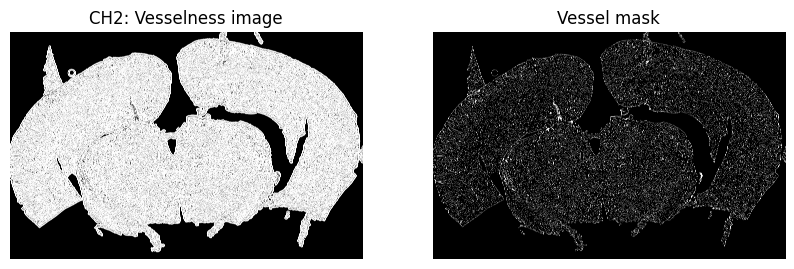

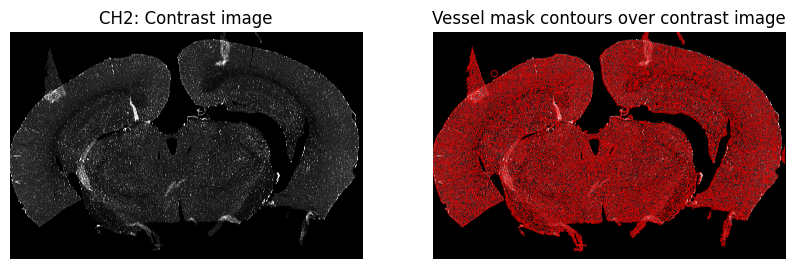

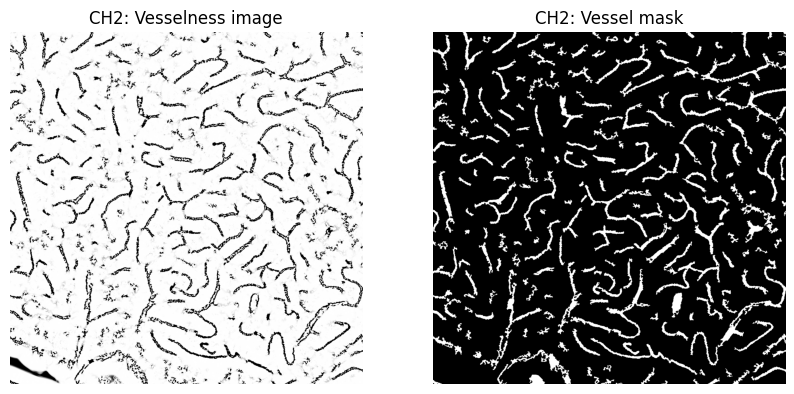

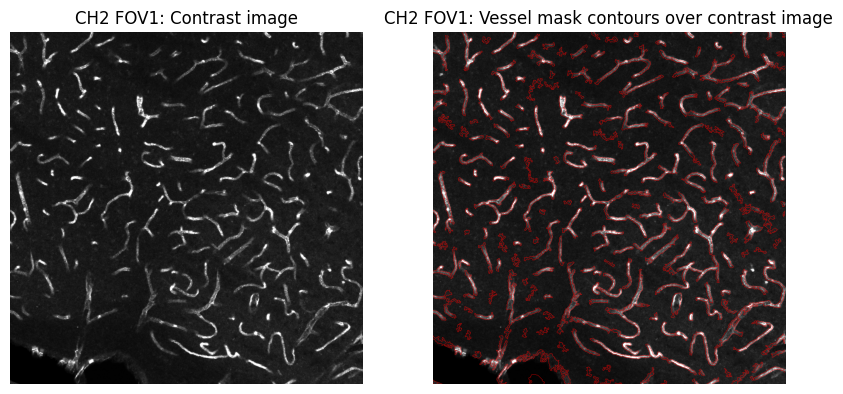

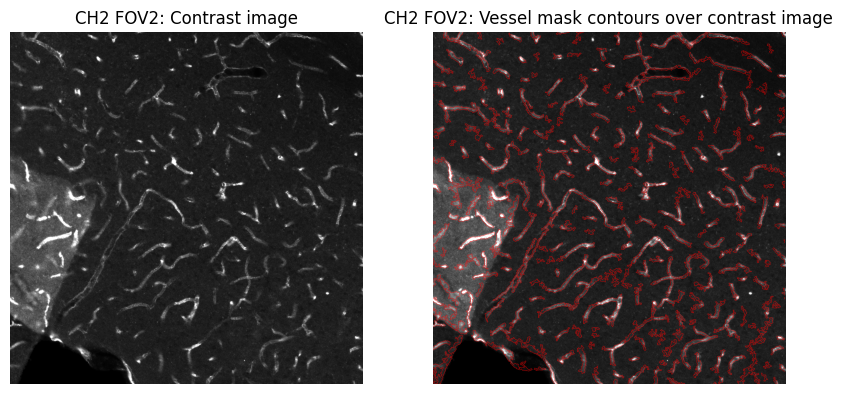

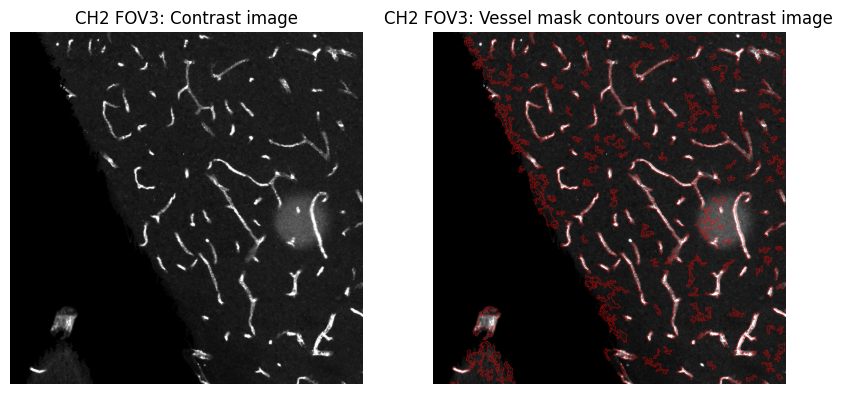

In [23]:
# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0  # 10
number_of_sigma_steps = 10  # 10 Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 100  # Minimum size of objects to keep
area_threshold = 2000 # Minimum area of holes to keep
smoothing = 1  # Smoothing factor for closing, 3

xlim = [4000, 5000]  # 8000, 9000 or 9000, 10000
ylim = [4000, 5000]  # 8000, 9000

#############################################################

# Alternative: load image in memory
#input_image = contrast_ch2 * bg_mask
input_image = cc_ch2 * bg_mask
input_image = input_image.astype(np.float32)
input_image *= 255.0

# Print statistics
print("Input image type:", input_image.dtype)
print("Input image min:", input_image.min())
print("Input image max:", input_image.max())

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Process the thresholded vessels
thresholded_vessels_ch2 = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
thresholded_vessels_ch2 = thresholded_vessels_ch2 * bg_mask

# Print statistics
print("Vesselness image statistics:")
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:", np.median(segmented_vessels_array))
#print("Std:", segmented_vessels_array.std())

print("CHANNEL 2")

# Plot the raw vesselness image
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("CH2: Vesselness image")
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels_ch2, cmap='gray')
plt.axis('off')
plt.title("Vessel mask")
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("CH2: Contrast image")
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels_ch2, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("Vessel mask contours over contrast image")
plt.show()
f.clear()
plt.close(f)

# Plot the raw vesselness image
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("CH2: Vesselness image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels_ch2, cmap='gray')
plt.axis('off')
plt.title("CH2: Vessel mask")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("CH2 FOV1: Contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels_ch2, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH2 FOV1: Vessel mask contours over contrast image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()
f.clear()
plt.close(f)

# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("CH2 FOV2: Contrast image")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels_ch2, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH2 FOV2: Vessel mask contours over contrast image")
plt.xlim([2000, 3000])
plt.ylim([2000, 3000])
plt.show()
f.clear()
plt.close(f)


# Show the results
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("CH2 FOV3: Contrast image")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels_ch2, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("CH2 FOV3: Vessel mask contours over contrast image")
plt.xlim([11000, 12000])
plt.ylim([5000, 6000])
plt.show()
f.clear()
plt.close(f)

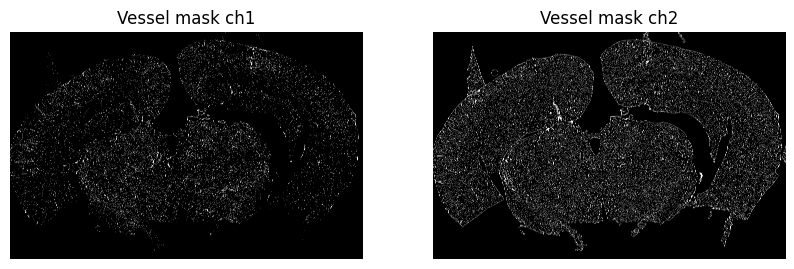

In [27]:
LOAD_NPY = False

if LOAD_NPY:
    thresholded_vessels_ch1 = np.load("mask_enhanced_ch1.npy")
    thresholded_vessels_ch2 = np.load("mask_enhanced_ch2.npy")
    #thresholded_vessels_ch2 = np.load("mask_enhanced_ch2.npy")

# Compare side-by-side
f = plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(thresholded_vessels_ch1, cmap='gray')
plt.axis('off')
plt.title("Vessel mask ch1")
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels_ch2, cmap='gray')
plt.axis('off')
plt.title("Vessel mask ch2")
plt.show()
f.clear()
plt.close(f)

np.save("mask_enhanced_ch0.npy", thresholded_vessels_ch1)
np.save("mask_enhanced_ch1.npy", thresholded_vessels_ch2)
#np.save("mask_enhanced_ch2.npy", thresholded_vessels_ch2)

## Compute statistics 

In [28]:
import csv
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
from scipy.spatial.distance import hamming

def dice_coefficient(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the Dice coefficient between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - dice: Dice coefficient.
    """
    intersection = np.sum(binary_image1 * binary_image2)
    size1 = np.sum(binary_image1)
    size2 = np.sum(binary_image2)
    
    dice = (2. * intersection + epsilon) / (size1 + size2 + epsilon)
    return dice


def iou(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the Intersection over Union (IoU) between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - iou: IoU.
    """
    intersection = np.sum(binary_image1 * binary_image2)
    union = np.sum(binary_image1 + binary_image2)
    
    if union == 0:
        iou = 1.0
    
    iou = (intersection + epsilon) / (union + epsilon)
    return iou


def precision(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the precision between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - precision: Precision.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_positives = np.sum(binary_image1 * (1 - binary_image2))
    
    precision = (true_positives) / (true_positives + false_positives + epsilon)
    return precision


def recall(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the recall between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - recall: Recall.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_negatives = np.sum((1 - binary_image1) * binary_image2)
    
    recall = true_positives / (true_positives + false_negatives + epsilon)
    return recall


def rand_index(binary_image1, binary_image2):
    """
    Compute the Rand index between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - rand_index: Rand index.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_positives = np.sum(binary_image1 * (1 - binary_image2))
    false_negatives = np.sum((1 - binary_image1) * binary_image2)
    true_negatives = np.sum((1 - binary_image1) * (1 - binary_image2))
    
    rand_index = (true_positives + true_negatives) / (true_positives + false_positives + false_negatives + true_negatives)
    return rand_index


original:  

Dice coefficient: 0.43695166076673947

IoU score: 0.2795509580855844

Precision score: 0.4814566313128634

Recall score: 0.39997838985918494

SSIM score: 0.6475111731566928

MSE score: 0.1478124386552875

Hamming distance: 0.1478124386552875

Rand index: 0.8521875613447125


In [29]:
thresholded_ch0 = thresholded_vessels_ch1
thresholded_ch1 = thresholded_vessels_ch2

# Compute the metrics
dice_score = dice_coefficient(thresholded_ch0, thresholded_ch1)  
iou_score = iou(thresholded_ch0, thresholded_ch1)  # Strongly penalizes over-segmentation and under-segmentation
precision_score = precision(thresholded_ch0, thresholded_ch1) 
recall_score = recall(thresholded_ch0, thresholded_ch1)
ssim_score = ssim(thresholded_ch0, thresholded_ch1)
mse_score = mean_squared_error(thresholded_ch0, thresholded_ch1)
thresh_ch0_flat = thresholded_ch0.flatten()
thresh_ch1_flat = thresholded_ch1.flatten()
hamming_distance = hamming(thresh_ch0_flat, thresh_ch1_flat)
rand_score = rand_index(thresholded_ch0, thresholded_ch1)  # Measures how close points are clustered together

print("Dice coefficient:", dice_score)
print("IoU score:", iou_score)
print("Precision score:", precision_score)
print("Recall score:", recall_score)
print("SSIM score:", ssim_score)
print("MSE score:", mse_score)
print("Hamming distance:", hamming_distance)
print("Rand index:", rand_score)

# Write the solutions to a CSV file
csv_filename = 'stats_enhanced_M63.csv'

# Write to rows
rows = [["Index", "Dice coefficient", "IoU score", "Precision", "Recall", "SSIM", "MSE", "Hamming distance", "Rand index"]]
rows.append([IDX, dice_score, iou_score, precision_score, recall_score, ssim_score, mse_score, hamming_distance, rand_score])

#with open(csv_filename, mode='w', newline='') as file:
#    writer = csv.writer(file)
#    writer.writerows(rows)

Dice coefficient: 0.3977914131551905
IoU score: 0.2482769200098668
Precision score: 0.6693337344766893
Recall score: 0.28298648952655814
SSIM score: 0.8203964658860123
MSE score: 0.06584869762160074
Hamming distance: 0.06584869762160074
Rand index: 0.9341513023783993


Run the whole thing

from tqdm import tqdm

data_path = "/media/data/u01/Fig7/7a/M64/*.tif"
output_ch1_path = "/media/data/u01/lightsheet/quant-fig7/7a-M64/segmentation/ch1/"
output_ch2_path = "/media/data/u01/lightsheet/quant-fig7/7a-M64/segmentation/ch2/"
output_csv_ch1_ch2_path = "/media/data/u01/lightsheet/quant-fig7/7a-M64/stats_enhanced2_ch1_ch2.csv"

################################################################################

#gamma_ch0 = 2  # You can adjust this value to control the contrast enhancement
#contrast_alpha_ch0 = 0.5  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default
gamma_ch1 = 2
contrast_alpha_ch1 = 1.5
gamma_ch2 = 2
contrast_alpha_ch2 = 1.5

# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0  # 10
number_of_sigma_steps = 10  # 10 Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 10  # Minimum size of objects to keep
area_threshold = 2000 # Minimum area of holes to keep
smoothing = 1  # Smoothing factor for closing, 3

# Read all tif files in the folder
data_files = sorted(glob.glob(data_path))
num_slices = len(data_files) // 2
#rows_ch0_ch1 = [["Index", "Dice coefficient", "IoU score", "Precision", "Recall", "SSIM", "MSE", "Hamming distance", "Rand index"]]
#rows_ch0_ch2 = [["Index", "Dice coefficient", "IoU score", "Precision", "Recall", "SSIM", "MSE", "Hamming distance", "Rand index"]]
rows_ch1_ch2 = [["Index", "Dice coefficient", "IoU score", "Precision", "Recall", "SSIM", "MSE", "Hamming distance", "Rand index"]]

for i in tqdm(range(num_slices)):
    i = i * 2  # Indexes are in pairs
    curr_img = (read_tif(data_files[i]), read_tif(data_files[i + 1]))
    #curr_ch0 = curr_img[:, :, 0]
    curr_ch1 = curr_img[0]
    curr_ch2 = curr_img[1]
    
    # Compute the original image contrast
    #contrast_ch0 = curr_ch0
    contrast_ch1 = curr_ch1
    contrast_ch2 = curr_ch2
    
    #contrast_ch0 = gamma_correction(curr_ch0, gamma=gamma_ch0)
    #contrast_ch0 = auto_contrast(contrast_ch0, alpha=contrast_alpha_ch0)
    #contrast_ch1 = gamma_correction(curr_ch1, gamma=gamma_ch1)
    #contrast_ch1 = auto_contrast(contrast_ch1, alpha=contrast_alpha_ch1)
    #contrast_ch2 = gamma_correction(curr_ch2, gamma=gamma_ch2)
    #contrast_ch2 = auto_contrast(contrast_ch2, alpha=contrast_alpha_ch2)
    
    if i != 9999:
        bg_alpha = 1
    else:
        bg_alpha = 0.25
    bg_mask = auto_contrast(curr_ch1, alpha=bg_alpha)
    bg_mask = get_brain_mask(bg_mask, area_threshold=25000)
    
    #############################################################

    # Load image in memory
    #input_ch0 = contrast_ch0 * bg_mask
    #input_ch0 = input_ch0.astype(np.float32)
    #input_ch0 *= 255.0
    
    input_ch1 = contrast_ch1 * bg_mask
    input_ch1 = input_ch1.astype(np.float32)
    input_ch1 *= 255.0
    
    input_ch2 = contrast_ch2 * bg_mask
    input_ch2 = input_ch2.astype(np.float32)
    input_ch2 *= 255.0

    # Run the vessel detection
    #segmented_vessels_ch0 = detect_vessels(input_ch0, sigma_minimum, sigma_maximum, number_of_sigma_steps)
    segmented_vessels_ch1 = detect_vessels(input_ch1, sigma_minimum, sigma_maximum, number_of_sigma_steps)
    segmented_vessels_ch2 = detect_vessels(input_ch2, sigma_minimum, sigma_maximum, number_of_sigma_steps)

    # Process the thresholded vessels
    #thresholded_vessels_ch0 = process_vessels(segmented_vessels_ch0, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
    thresholded_vessels_ch1 = process_vessels(segmented_vessels_ch1, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
    thresholded_vessels_ch2 = process_vessels(segmented_vessels_ch2, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)

    #thresholded_vessels_ch0 = thresholded_vessels_ch0 * bg_mask
    thresholded_vessels_ch1 = thresholded_vessels_ch1 * bg_mask
    thresholded_vessels_ch2 = thresholded_vessels_ch2 * bg_mask

    # Save to file
    #sitk_ch0 = sitk.GetImageFromArray(thresholded_vessels_ch0.astype(np.uint8))  # Ch0
    #output_ch0_file = output_ch0_path + f"ch0_seg_{str(i).zfill(4)}.tif"
    #sitk.WriteImage(sitk_ch0, output_ch0_file)
    sitk_ch1 = sitk.GetImageFromArray(thresholded_vessels_ch1.astype(np.uint8))  # Ch1
    output_ch1_file = output_ch1_path + f"ch1_seg_{str(i//2).zfill(4)}.tif"
    sitk.WriteImage(sitk_ch1, output_ch1_file)
    sitk_ch2 = sitk.GetImageFromArray(thresholded_vessels_ch2.astype(np.uint8))  # Ch1
    output_ch2_file = output_ch2_path + f"ch2_seg_{str(i//2).zfill(4)}.tif"
    sitk.WriteImage(sitk_ch1, output_ch2_file)
    
    """
    # Compute statistics between ch0 and ch1
    dice_score = dice_coefficient(thresholded_vessels_ch0, thresholded_vessels_ch1)  
    iou_score = iou(thresholded_vessels_ch0, thresholded_vessels_ch1)  # Strongly penalizes over-segmentation and under-segmentation
    precision_score = precision(thresholded_vessels_ch0, thresholded_vessels_ch1) 
    recall_score = recall(thresholded_vessels_ch0, thresholded_vessels_ch1)
    ssim_score = ssim(thresholded_vessels_ch0, thresholded_vessels_ch1)
    mse_score = mean_squared_error(thresholded_vessels_ch0, thresholded_vessels_ch1)
    thresh_ch0_flat = thresholded_vessels_ch0.flatten()
    thresh_ch1_flat = thresholded_vessels_ch1.flatten()
    hamming_distance = hamming(thresh_ch0_flat, thresh_ch1_flat)
    rand_score = rand_index(thresholded_vessels_ch0, thresholded_vessels_ch1)  # Measures how close points are clustered together
    rows_ch0_ch1.append([i, dice_score, iou_score, precision_score, recall_score, ssim_score, mse_score, hamming_distance, rand_score])
    print("ch0-ch1:", rows_ch0_ch1[i + 1])
    
    
    # Compute statistics between ch0 and ch2
    dice_score = dice_coefficient(thresholded_vessels_ch0, thresholded_vessels_ch2)  
    iou_score = iou(thresholded_vessels_ch0, thresholded_vessels_ch2)  # Strongly penalizes over-segmentation and under-segmentation
    precision_score = precision(thresholded_vessels_ch0, thresholded_vessels_ch2) 
    recall_score = recall(thresholded_vessels_ch0, thresholded_vessels_ch2)
    ssim_score = ssim(thresholded_vessels_ch0, thresholded_vessels_ch2)
    mse_score = mean_squared_error(thresholded_vessels_ch0, thresholded_vessels_ch2)
    thresh_ch2_flat = thresholded_vessels_ch2.flatten()
    hamming_distance = hamming(thresh_ch0_flat, thresh_ch2_flat)
    rand_score = rand_index(thresholded_vessels_ch0, thresholded_vessels_ch2)  # Measures how close points are clustered together
    rows_ch0_ch2.append([i, dice_score, iou_score, precision_score, recall_score, ssim_score, mse_score, hamming_distance, rand_score])
    print("ch0-ch2:", rows_ch0_ch2[i + 1])
    """
    
    # Compute statistics between ch1 and ch2
    thresh_ch1_flat = thresholded_vessels_ch1.flatten()
    thresh_ch2_flat = thresholded_vessels_ch2.flatten()
    dice_score = dice_coefficient(thresholded_vessels_ch1, thresholded_vessels_ch2)  
    iou_score = iou(thresholded_vessels_ch1, thresholded_vessels_ch2)  # Strongly penalizes over-segmentation and under-segmentation
    precision_score = precision(thresholded_vessels_ch1, thresholded_vessels_ch2) 
    recall_score = recall(thresholded_vessels_ch1, thresholded_vessels_ch2)
    ssim_score = ssim(thresholded_vessels_ch1, thresholded_vessels_ch2)
    mse_score = mean_squared_error(thresholded_vessels_ch1, thresholded_vessels_ch2)
    hamming_distance = hamming(thresh_ch1_flat, thresh_ch2_flat)
    rand_score = rand_index(thresholded_vessels_ch1, thresholded_vessels_ch2)  # Measures how close points are clustered together
    rows_ch1_ch2.append([i, dice_score, iou_score, precision_score, recall_score, ssim_score, mse_score, hamming_distance, rand_score])
    print("ch1-ch2:", rows_ch1_ch2[i//2 + 1])
    
"""
with open(output_csv_ch0_ch1_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows_ch0_ch1)
    
with open(output_csv_ch0_ch2_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows_ch0_ch2)
"""
    
with open(output_csv_ch1_ch2_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows_ch1_ch2)